# Draft: Monochromator Fitter

## Load Data

In [27]:
# Get files 
# !ls ~/Downloads/monochromator_local/calib_20250307T222525*

In [1]:
import glob 

regex = '/Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/*'
files = sorted(glob.glob(regex))
# files

In [2]:
regex = '/Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left*'
lfiles = sorted(glob.glob(regex))

regex = '/Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_right*'
rfiles = sorted(glob.glob(regex))


In [6]:
import numpy as np
def get_wav(f):
    mystr = f.split('_')[-1]
    mystr = mystr.split('angs')[0]
    return int(mystr)/10
wav = np.array([get_wav(f) for f in lfiles])

In [7]:
def read_file(f):
    w = np.genfromtxt(f)[:,0]
    c = np.genfromtxt(f)[:,1]
    return w,c

In [11]:
# ix = 19
w, dark = read_file(files[0])
datal = np.array([read_file(lf)[1] for lf in lfiles])
datar = np.array([read_file(rf)[1] for rf in rfiles])

cl = np.median(datal,axis=0)
cr = np.median(datar,axis=0)

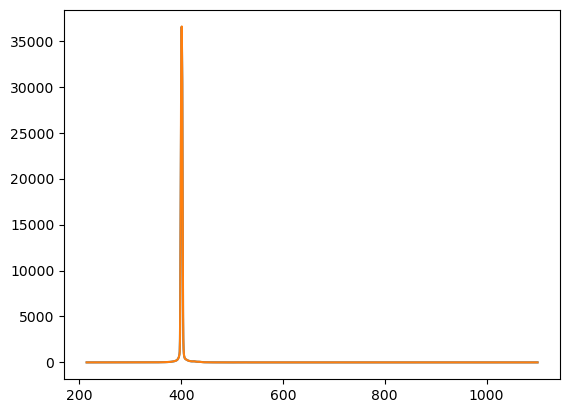

In [12]:
import matplotlib.pyplot as plt
plt.plot(w,cl-dark)
plt.plot(w,cr-dark)

In [13]:
from scipy.signal import find_peaks, peak_widths

distance = 20
height = 2000
intensities = cl-dark
x_data = w
peaks, properties = find_peaks(intensities,
                               height=height,
                               distance=distance)
results_half = peak_widths(intensities, peaks, rel_height=0.5)
peak_x_positions = x_data[peaks]
peak_intensities = intensities[peaks]

In [14]:
dp = int(results_half[0])
results_b = peak_widths(intensities, peaks, rel_height=0.91)
dh = results_b[1]

/var/folders/9w/7v0prkkd4v316l4bdkm114c00000gq/T/ipykernel_34210/2353960071.py:1: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  dp = int(results_half[0])


Text(0, 0.5, 'Counts [ADU]')

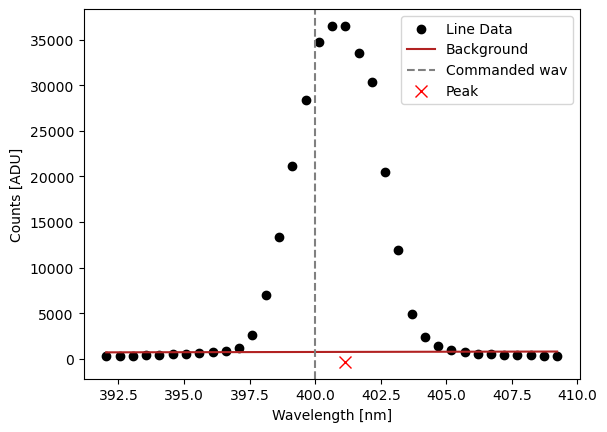

In [15]:
ilow = int(peaks[0]-2.5*dp)
ihigh = int(peaks[0]+2.5*dp)
mask = intensities[ilow:ihigh]<dh
c = np.polyfit(x_data[ilow:ihigh][mask], intensities[ilow:ihigh][mask],1)
bg = np.polyval(c,x_data[ilow:ihigh])
pointsH = bg[ihigh-peaks[0]] - peak_intensities*3/100

plt.scatter(x_data[ilow:ihigh], intensities[ilow:ihigh], color='k', label='Line Data')
plt.plot(x_data[ilow:ihigh], bg, color='firebrick', label='Background')
plt.axvline(wav[ix], ls='--', color='grey', label='Commanded wav')
plt.plot(peak_x_positions, pointsH, 'rx', markersize=8, label='Peak')
plt.legend()
plt.xlabel("Wavelength [nm]")
plt.ylabel("Counts [ADU]")

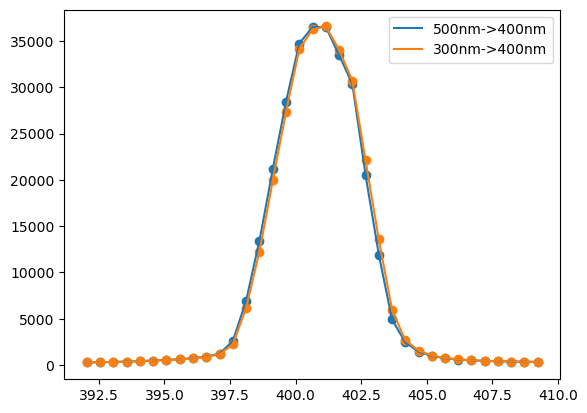

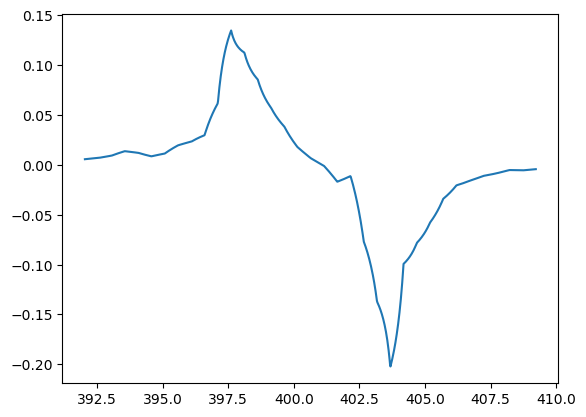

In [21]:
from scipy.interpolate import interp1d
intensitiesLeft=cl-dark
intensitiesRight=cr-dark
fl = interp1d(x_data[ilow:ihigh], intensitiesLeft[ilow:ihigh])
fr = interp1d(x_data[ilow:ihigh], intensitiesRight[ilow:ihigh])
xvec = np.linspace(x_data[ilow:ihigh].min(),x_data[ilow:ihigh].max(), 1000)

plt.plot(xvec, fl(xvec), label='500nm->400nm')
plt.plot(xvec, fr(xvec), label='300nm->400nm')
plt.scatter(x_data[ilow:ihigh], intensitiesLeft[ilow:ihigh])
plt.scatter(x_data[ilow:ihigh], intensitiesRight[ilow:ihigh])
plt.legend()

plt.figure()
plt.plot(xvec, (fl(xvec)-fr(xvec))/fl(xvec), label='R-L')
# plt.plot(xvec, , label='300nm->400nm')

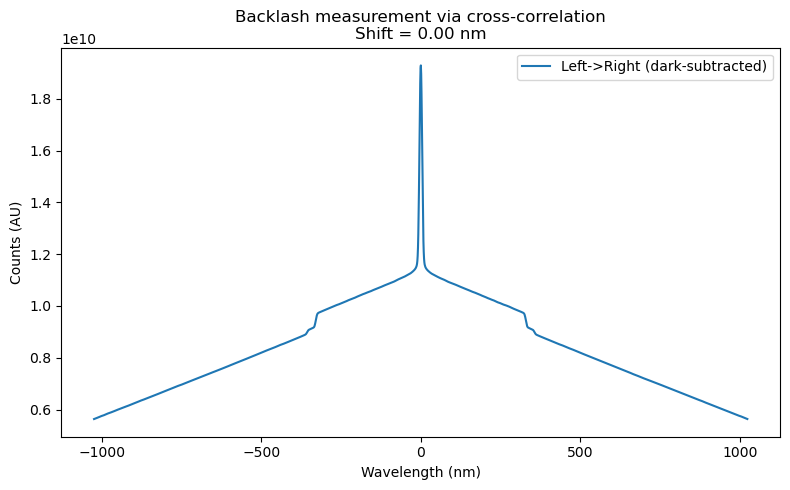

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate, correlation_lags

# Example usage
ix = 19
w, dark = read_file(files[0])
w, cl = read_file(lfiles[ix])  # left->right scan
w, cr = read_file(rfiles[ix])  # right->left scan

cc = correlate(cl, cr, mode='same')
lags = correlation_lags(len(cl), len(cr), mode='same')

# Plot for visualization
plt.figure(figsize=(8,5))
plt.plot(lags, cc, label='Left->Right (dark-subtracted)')
# plt.plot(w, right_uni, label='Right->Left (dark-subtracted)')
plt.xlabel("Wavelength (nm)")
plt.ylabel("Counts (AU)")
plt.title(f"Backlash measurement via cross-correlation\nShift = {shift_nm:.2f} nm")
plt.legend()
plt.tight_layout()
plt.show()


In [67]:
lags[np.argmax(cc)]

0

In [15]:
from scipy.interpolate import interp1d
pixel = np.arange(x_data.size, dtype=int)
# specCoefs = np.polyfit(x_data,pixel,5)
wav2pixel = interp1d(x_data, pixel)
pixel2wav = interp1d(pixel, x_data)

0 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_00_4000angs.txt
1 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_01_4000angs.txt
2 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_02_4000angs.txt
3 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_03_4000angs.txt
4 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_04_4000angs.txt
5 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_05_4000angs.txt
6 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_06_4000angs.txt
7 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_07_4000angs.txt
8 /Users/esteves/Downloads/monochromator_local/backlash_

/Users/esteves/Documents/github/PANDORA/pandora/calibration/monochromator_calib.py:243: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(6,4))


24 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_24_4000angs.txt
25 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_25_4000angs.txt
26 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_26_4000angs.txt
27 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_27_4000angs.txt
28 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_28_4000angs.txt
29 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_29_4000angs.txt
30 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_30_4000angs.txt
31 /Users/esteves/Downloads/monochromator_local/backlash_20250310T111722/20250310T111722_20ms_wav_left_31_4000angs.txt
32 /Users/esteves/Downloads/monochromator_local/

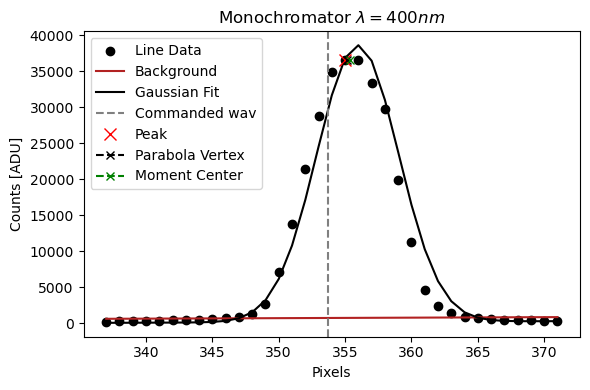

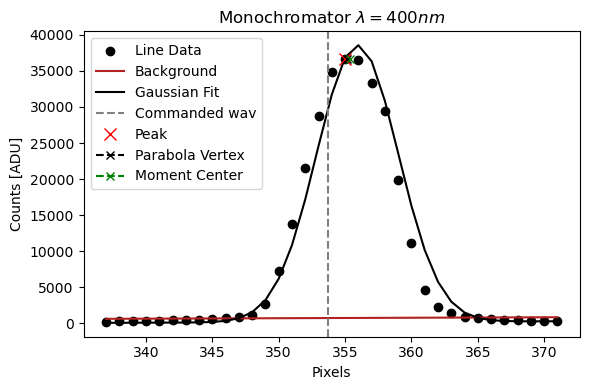

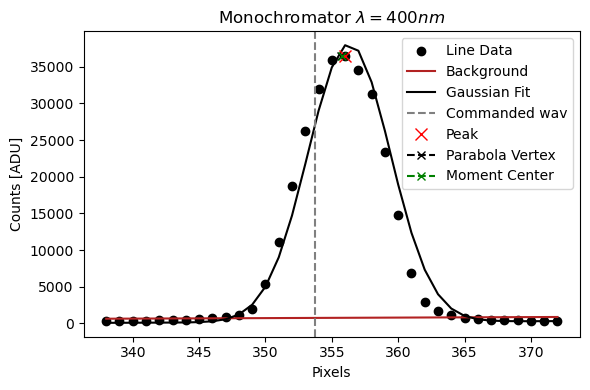

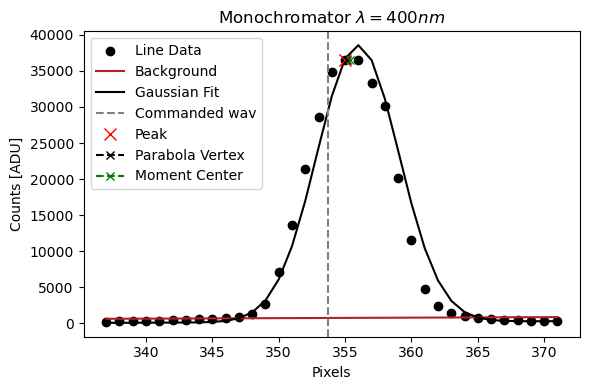

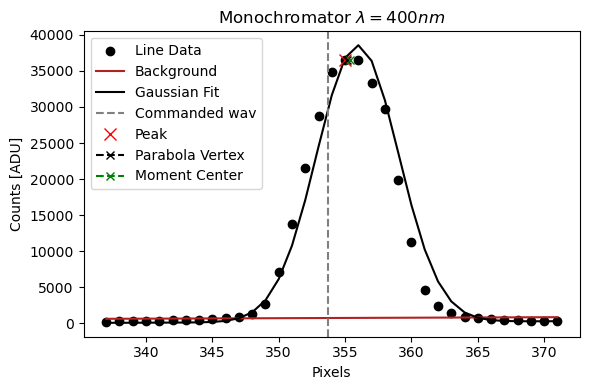

...

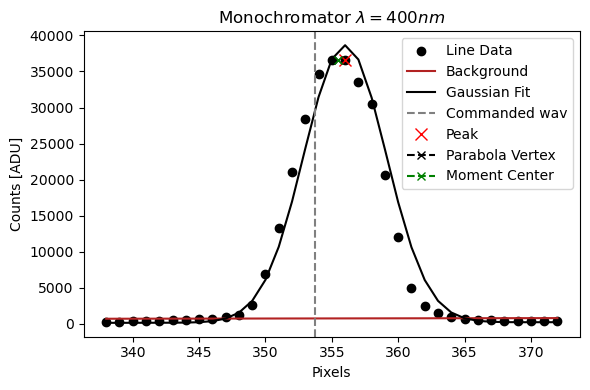

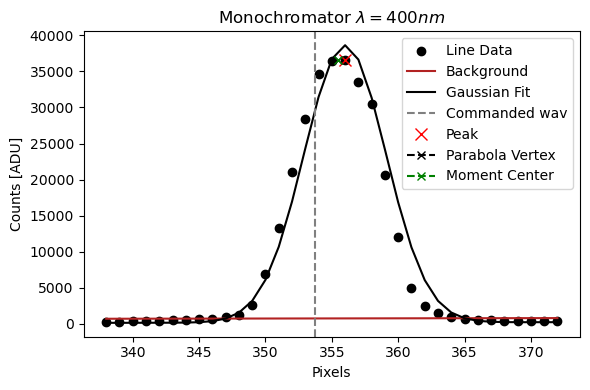

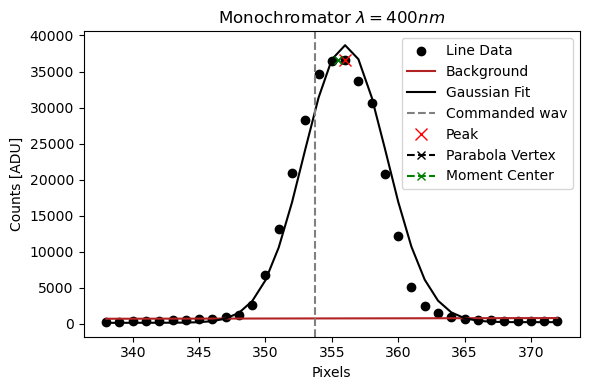

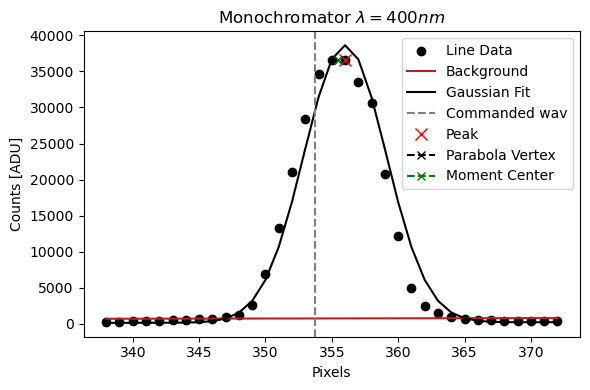

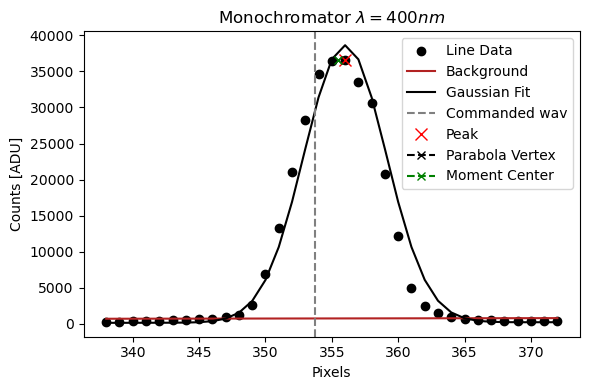

In [45]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from pandora.calibration.monochromator_calib import monoLineFinder

peaks, vertex, cen = [], [], []
heights = []
trues = []

# Create one PDF file that will collect all figures

for i in range(wav.size):
    wavelength = wav[i]
    f  = lineFiles[i]
    print(i, f)
    x_data, intensities = read_file(f)
    tp = wav2pixel(wavelength)

    finder = monoLineFinder(x_data, intensities-dark,
                            distance=1100, height=50,
                            rel_height_bg=0.91, rel_height_peak=0.5)

    p = finder.find_line()
    v, c = finder.measure_centroids()
    popt, pcov = finder.fit_gaussian_line()

    # This returns a matplotlib Figure
    fig = finder.plot_line(commanded_wav=[wavelength, tp])

    # Collect numeric data for later usage
    peaks.append(p)
    vertex.append(v)
    cen.append(c)
    trues.append(tp)
    heights.append(finder.peak_intensities)

# Convert to arrays if desired
peaks = np.array(peaks)
vertex = np.array(vertex)
cen = np.array(cen)
trues = np.array(trues)
heights = np.array(heights)

Text(0.5, 1.0, 'Monochromator Scan (LDLS)')

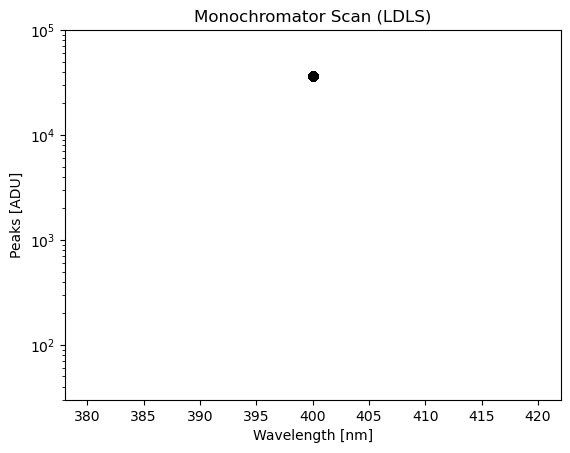

In [17]:
ix = np.argsort(wav)
plt.scatter(wav, heights, color='k')
plt.plot(wav[ix], heights[ix], color='r')
plt.xlabel("Wavelength [nm]")
plt.ylabel("Peaks [ADU]")
plt.yscale("log")
plt.ylim(3e1,1e5)
plt.title("Monochromator Scan (LDLS)")

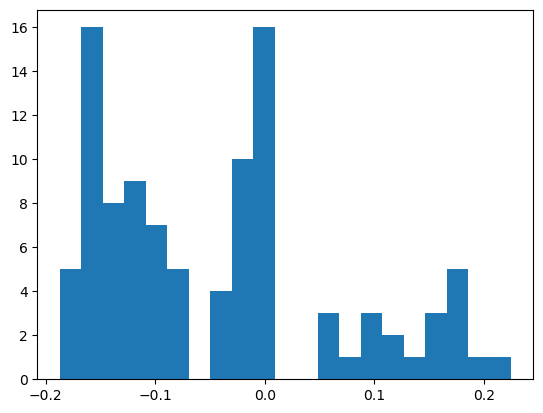

In [104]:
r = cen[:100]
l = cen[100:]
_ = plt.hist(pixel2wav(r)-pixel2wav(l), bins=21)

# r = vertex[:100]
# l = vertex[100:]
# _ = plt.hist(r-l, bins=21)

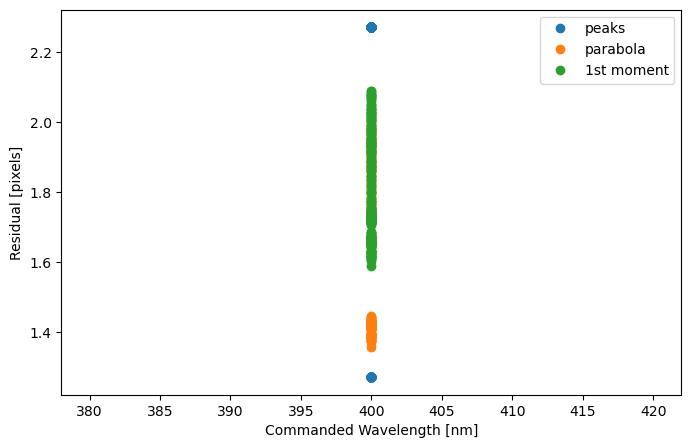

In [18]:

plt.figure(figsize=(8,5))

methods = ['peaks','parabola','1st moment']
for i, x in enumerate([peaks, vertex, cen]):
    plt.plot(wav, x-trues, 'o', label=methods[i])
    plt.ylabel('Residual [pixels]')
    plt.xlabel('Commanded Wavelength [nm]')
    plt.legend()

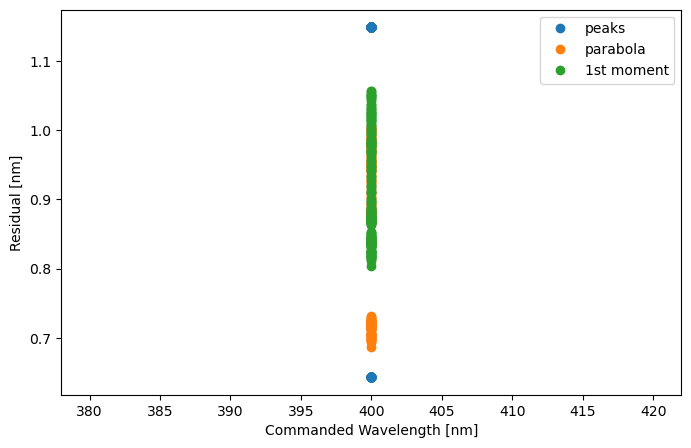

In [19]:
methods = ['peaks','parabola','1st moment']
plt.figure(figsize=(8,5))
for i, x in enumerate([peaks, vertex, cen]):
    plt.plot(wav, pixel2wav(x)-wav, 'o', label=methods[i])
    plt.ylabel('Residual [nm]')
    plt.xlabel('Commanded Wavelength [nm]')
    plt.legend()